### Checking environment

In [ ]:
!python --version
!conda --version
!which conda
!which python
!which jupyter
!which pip

In [ ]:
!pip list

## Notes

this is my case for clients' computer:
 - have folders in ./csv/bandwidth
 - there are 15 folder there, named screenshots 1 to screenshots 15, and each folder related to a client computer
 - there is a folder named screenshots presenter, and it related to the presenter computer
 - each folder contain csv files, named 2023-01-30-gmeet.csv, 2023-02-01-zoom.csv, and 2023-02-03_07-siruntu.csv
 - each csv file contain columns: time, Event, Pid, File, Directory, IP, Port, Country, Download (bytes),Upload (bytes), and Protocol
 - each csv file contain rows of data

so, i want to show data of each csv file in each folder in one graph:
 - i want to show the data of 2023-01-30-gmeet.csv in screenshots 1 folder in one graph
 - i want to show the data of 2023-02-01-zoom.csv in screenshots 2 folder in one graph
 - and so on

In [68]:
from datetime import datetime
import pandas as pd

gmeet_presenter = {
    # first index is start time, second index is end time
    "webcam": ['2023-01-30 14-06-42', '2023-01-30 14-32-59'],
    "screen": ['2023-01-30 14-38-01', '2023-01-30 15-06-53']
}

zoom_presenter = {
    "webcam": ['2023-02-01 14-10-00', '2023-02-01 14-37-39'],
    "screen": ['2023-02-01 14-40-00', '2023-02-01 15-06-51']
}

siruntu_presenter = {
    "webcam": ['2023-02-15 14-20-14', '2023-02-15 14-48-00'],
    "screen": ['2023-02-15 14-50-30', '2023-02-15 15-20-15']
}

# format
gmeet_clients = [
    {  # viewer_1 v
        "webcam": ['2023-01-30 14-08-36', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-40-16', '2023-01-30 15-06-53']
    },
    {  # viewer_2 v
        "webcam": ['2023-01-30 14-09-26', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-41-12', '2023-01-30 15-06-53']
    },
    {  # viewer_3 v
        "webcam": ['2023-01-30 14-10-25', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-42-16', '2023-01-30 15-06-53']
    },
    {  # viewer_4 v
        "webcam": ['2023-01-30 14-11-22', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-43-10', '2023-01-30 15-06-53']
    },
    {  # viewer_5 v
        "webcam": ['2023-01-30 14-12-19', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-44-12', '2023-01-30 15-06-53']
    },
    {  # viewer_6 v
        "webcam": ['2023-01-30 14-14-39', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-46-55', '2023-01-30 15-06-53']
    },
    {  # viewer_7 v
        "webcam": ['2023-01-30 14-14-42', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-46-12', '2023-01-30 15-06-53']
    },
    {  # viewer_8 v
        "webcam": ['2023-01-30 14-15-19', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-47-34', '2023-01-30 15-06-53']
    },
    {  # viewer_9 v
        "webcam": ['2023-01-30 14-16-26', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-48-32', '2023-01-30 15-06-53']
    },
    {  # viewer_10 v
        "webcam": ['2023-01-30 14-17-14', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-49-56', '2023-01-30 15-06-53']
    },
    {  # viewer_11 v
        "webcam": ['2023-01-30 14-18-20', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-51-21', '2023-01-30 15-06-53']
    },
    {  # viewer_12 v
        "webcam": ['2023-01-30 14-19-16', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-53-11', '2023-01-30 15-06-53']
    },
    {  # viewer_13 v
        "webcam": ['2023-01-30 14-20-15', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-54-11', '2023-01-30 15-06-53']
    },
    {  # viewer_14 v
        "webcam": ['2023-01-30 14-21-15', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-55-15', '2023-01-30 15-06-53']
    },
    {  # viewer_15
        "webcam": ['2023-01-30 14-22-17', '2023-01-30 14-32-59'],
        "screen": ['2023-01-30 14-56-11', '2023-01-30 15-06-53']
    }
]

zoom_clients = [
    {  # viewer_1 v
        "webcam": ['2023-02-01 14-11-50', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-41-14', '2023-02-01 15-06-51']
    },
    {  # viewer_2 v
        "webcam": ['2023-02-01 14-12-39', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-42-19', '2023-02-01 15-06-51']
    },
    {  # viewer_3 v
        "webcam": ['2023-02-01 14-13-43', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-43-15', '2023-02-01 15-06-51']
    },
    {  # viewer_4 v
        "webcam": ['2023-02-01 14-14-17', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-44-22', '2023-02-01 15-06-51']
    },
    {  # viewer_5 v
        "webcam": ['2023-02-01 14-15-31', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-45-14', '2023-02-01 15-06-51']
    },
    {  # viewer_6 v
        "webcam": ['2023-02-01 14-17-50', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-47-47', '2023-02-01 15-06-51']
    },
    {  # viewer_7 v
        "webcam": ['2023-02-01 14-17-33', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-47-26', '2023-02-01 15-06-51']
    },
    {  # viewer_8 v
        "webcam": ['2023-02-01 14-18-29', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-48-20', '2023-02-01 15-06-51']
    },
    {  # viewer_9 v
        "webcam": ['2023-02-01 14-19-20', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-49-16', '2023-02-01 15-06-51']
    },
    {  # viewer_10 v
        "webcam": ['2023-02-01 14-20-23', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-50-11', '2023-02-01 15-06-51']
    },
    {  # viewer_11 v
        "webcam": ['2023-02-01 14-22-01', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-51-22', '2023-02-01 15-06-51']
    },
    {  # viewer_12 v
        "webcam": ['2023-02-01 14-24-01', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-52-13', '2023-02-01 15-06-51']
    },
    {  # viewer_13 v
        "webcam": ['2023-02-01 14-25-38', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-53-15', '2023-02-01 15-06-51']
    },
    {  # viewer_14 v
        "webcam": ['2023-02-01 14-26-16', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-54-12', '2023-02-01 15-06-51']
    },
    {  # viewer_15 v
        "webcam": ['2023-02-01 14-27-20', '2023-02-01 14-37-39'],
        "screen": ['2023-02-01 14-55-13', '2023-02-01 15-06-51']
    }
]

siruntu_clients = [
    {  # viewer_1 v
        "webcam": ['2023-02-15 14-21-16', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-51-08', '2023-02-15 15-20-15']
    },
    {  # viewer_2 v
        "webcam": ['2023-02-15 14-22-06', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-52-05', '2023-02-15 15-20-15']
    },
    {  # viewer_3 v
        "webcam": ['2023-02-15 14-23-11', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-53-04', '2023-02-15 15-20-15']
    },
    {  # viewer_4 v
        "webcam": ['2023-02-15 14-25-07', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-54-03', '2023-02-15 15-20-15']
    },
    {  # viewer_5 v
        "webcam": ['2023-02-15 14-26-14', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-55-06', '2023-02-15 15-20-15']
    },
    {  # viewer_6 v
        "webcam": ['2023-02-15 14-27-09', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-56-05', '2023-02-15 15-20-15']
    },
    {  # viewer_7 v
        "webcam": ['2023-02-15 14-28-07', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-57-10', '2023-02-15 15-20-15']
    },
    {  # viewer_8 v
        "webcam": ['2023-02-15 14-29-11', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-58-05', '2023-02-15 15-20-15']
    },
    {  # viewer_9 v
        "webcam": ['2023-02-15 14-31-01', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 14-59-13', '2023-02-15 15-20-15']
    },
    {  # viewer_10 v
        "webcam": ['2023-02-15 14-32-08', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 15-00-16', '2023-02-15 15-20-15']
    },
    {  # viewer_11 v
        "webcam": ['2023-02-15 14-33-16', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 15-01-18', '2023-02-15 15-20-15']
    },
    {  # viewer_12 v
        "webcam": ['2023-02-15 14-34-07', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 15-02-09', '2023-02-15 15-20-15']
    },
    {  # viewer_13 v
        "webcam": ['2023-02-15 14-35-14', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 15-03-22', '2023-02-15 15-20-15']
    },
    {  # viewer_14 v
        "webcam": ['2023-02-15 14-36-19', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 15-04-18', '2023-02-15 15-20-15']
    },
    {  # viewer_15 v
        "webcam": ['2023-02-15 14-37-23', '2023-02-15 14-48-00'],
        "screen": ['2023-02-15 15-05-10', '2023-02-15 15-20-15']
    }
]

users = []
formats = f'%Y-%m-%d %H-%M-%S'

users.append({
    'name': 'presenter',
    'type': 'presenter',
    'gmeet_webcam_entered': datetime.strptime(gmeet_presenter['webcam'][0], formats),
    'gmeet_webcam_exited': datetime.strptime(gmeet_presenter['webcam'][1], formats),
    'gmeet_screen_entered': datetime.strptime(gmeet_presenter['screen'][0], formats),
    'gmeet_screen_exited': datetime.strptime(gmeet_presenter['screen'][1], formats),
    'zoom_webcam_entered': datetime.strptime(zoom_presenter['webcam'][0], formats),
    'zoom_webcam_exited': datetime.strptime(zoom_presenter['webcam'][1], formats),
    'zoom_screen_entered': datetime.strptime(zoom_presenter['screen'][0], formats),
    'zoom_screen_exited': datetime.strptime(zoom_presenter['screen'][1], formats),
    'siruntu_webcam_entered': datetime.strptime(siruntu_presenter['webcam'][0], formats),
    'siruntu_webcam_exited': datetime.strptime(siruntu_presenter['webcam'][1], formats),
    'siruntu_screen_entered': datetime.strptime(siruntu_presenter['screen'][0], formats),
    'siruntu_screen_exited': datetime.strptime(siruntu_presenter['screen'][1], formats),
})

for i, item in enumerate(gmeet_clients):
    users.append({
        'name': f'viewer_{str(i+1)}',
        'type': 'viewer',
        'gmeet_webcam_entered': datetime.strptime(gmeet_clients[i]['webcam'][0], formats),
        'gmeet_webcam_exited': datetime.strptime(gmeet_clients[i]['webcam'][1], formats),
        'gmeet_screen_entered': datetime.strptime(gmeet_clients[i]['screen'][0], formats),
        'gmeet_screen_exited': datetime.strptime(gmeet_clients[i]['screen'][1], formats),
        'zoom_webcam_entered': datetime.strptime(zoom_clients[i]['webcam'][0], formats),
        'zoom_webcam_exited': datetime.strptime(zoom_clients[i]['webcam'][1], formats),
        'zoom_screen_entered': datetime.strptime(zoom_clients[i]['screen'][0], formats),
        'zoom_screen_exited': datetime.strptime(zoom_clients[i]['screen'][1], formats),
        'siruntu_webcam_entered': datetime.strptime(siruntu_clients[i]['webcam'][0], formats),
        'siruntu_webcam_exited': datetime.strptime(siruntu_clients[i]['webcam'][1], formats),
        'siruntu_screen_entered': datetime.strptime(siruntu_clients[i]['screen'][0], formats),
        'siruntu_screen_exited': datetime.strptime(siruntu_clients[i]['screen'][1], formats),
    })

# save to csv
bandwidth_timestamps = pd.DataFrame(users)
bandwidth_timestamps.to_csv('bandwidth_timestamps.csv', index=False)

### List of dependencies

In [66]:
# dependencies
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt

formats = f'%Y-%m-%d %H-%M-%S'

### Dataframes timestamps of users entered and exited meetings

In [67]:
users = pd.read_csv('./csv/bandwidth_timestamps.csv')
bandwidth_timestamps = pd.DataFrame(users)
bandwidth_timestamps


,name,type,gmeet_webcam_entered,gmeet_webcam_exited,gmeet_screen_entered,gmeet_screen_exited,zoom_webcam_entered,zoom_webcam_exited,zoom_screen_entered,zoom_screen_exited,siruntu_webcam_entered,siruntu_webcam_exited,siruntu_screen_entered,siruntu_screen_exited
0,presenter,presenter,2023-01-30 14:06:42,2023-01-30 14:32:59,2023-01-30 14:38:01,2023-01-30 15:06:53,2023-02-01 14:10:00,2023-02-01 14:37:39,2023-02-01 14:40:00,2023-02-01 15:06:51,2023-02-15 14:20:14,2023-02-15 14:48:00,2023-02-15 14:50:30,2023-02-15 15:20:15
1,viewer_1,viewer,2023-01-30 14:08:36,2023-01-30 14:32:59,2023-01-30 14:40:16,2023-01-30 15:06:53,2023-02-01 14:11:50,2023-02-01 14:37:39,2023-02-01 14:41:14,2023-02-01 15:06:51,2023-02-15 14:21:16,2023-02-15 14:48:00,2023-02-15 14:51:08,2023-02-15 15:20:15
2,viewer_2,viewer,2023-01-30 14:09:26,2023-01-30 14:32:59,2023-01-30 14:41:12,2023-01-30 15:06:53,2023-02-01 14:12:39,2023-02-01 14:37:39,2023-02-01 14:42:19,2023-02-01 15:06:51,2023-02-15 14:22:06,2023-02-15 14:48:00,2023-02-15 14:52:05,2023-02-15 15:20:15
3,viewer_3,viewer,2023-01-30 14:10:25,2023-01-30 14:32:59,2023-01-30 14:42:16,2023-01-30 15:06:53,2023-02-01 14:13:43,2023-02-01 14:37:39,2023-02-01 14:43:15,2023-02-01 15:06:51,2023-02-15 14:23:11,2023-02-15 14:48:00,2023-02-15 14:53:04,2023-02-15 15:20:15
4,viewer_4,viewer,2023-01-30 14:11:22,2023-01-30 14:32:59,2023-01-30 14:43:10,2023-01-30 15:06:53,2023-02-01 14:14:17,2023-02-01 14:37:39,2023-02-01 14:44:22,2023-02-01 15:06:51,2023-02-15 14:25:07,2023-02-15 14:48:00,2023-02-15 14:54:03,2023-02-15 15:20:15
5,viewer_5,viewer,2023-01-30 14:12:19,2023-01-30 14:32:59,2023-01-30 14:44:12,2023-01-30 15:06:53,2023-02-01 14:15:31,2023-02-01 14:37:39,2023-02-01 14:45:14,2023-02-01 15:06:51,2023-02-15 14:26:14,2023-02-15 14:48:00,2023-02-15 14:55:06,2023-02-15 15:20:15
6,viewer_6,viewer,2023-01-30 14:14:39,2023-01-30 14:32:59,2023-01-30 14:46:55,2023-01-30 15:06:53,2023-02-01 14:17:50,2023-02-01 14:37:39,2023-02-01 14:47:47,2023-02-01 15:06:51,2023-02-15 14:27:09,2023-02-15 14:48:00,2023-02-15 14:56:05,2023-02-15 15:20:15
7,viewer_7,viewer,2023-01-30 14:14:42,2023-01-30 14:32:59,2023-01-30 14:46:12,2023-01-30 15:06:53,2023-02-01 14:17:33,2023-02-01 14:37:39,2023-02-01 14:47:26,2023-02-01 15:06:51,2023-02-15 14:28:07,2023-02-15 14:48:00,2023-02-15 14:57:10,2023-02-15 15:20:15
8,viewer_8,viewer,2023-01-30 14:15:19,2023-01-30 14:32:59,2023-01-30 14:47:34,2023-01-30 15:06:53,2023-02-01 14:18:29,2023-02-01 14:37:39,2023-02-01 14:48:20,2023-02-01 15:06:51,2023-02-15 14:29:11,2023-02-15 14:48:00,2023-02-15 14:58:05,2023-02-15 15:20:15
9,viewer_9,viewer,2023-01-30 14:16:26,2023-01-30 14:32:59,2023-01-30 14:48:32,2023-01-30 15:06:53,2023-02-01 14:19:20,2023-02-01 14:37:39,2023-02-01 14:49:16,2023-02-01 15:06:51,2023-02-15 14:31:01,2023-02-15 14:48:00,2023-02-15 14:59:13,2023-02-15 15:20:15


### Dataframes of client users (presenter and viewers) Bandwidth usage

In [69]:
# read csv file
bandwidth_df = pd.DataFrame()

for i in range(0, 16):
    name = i if i > 0 else 'presenter'
    folder = f'screenshots {str(name)}'
    filename_gmeet = '2023-01-30-gmeet.csv'
    filename_zoom = '2023-02-01-zoom.csv'
    filename_siruntu = '2023-02-15-siruntu.csv'
    path_gmeet = f'./csv/bandwidth/{folder}/{filename_gmeet}'
    path_zoom = f'./csv/bandwidth/{folder}/{filename_zoom}'
    path_siruntu = f'./csv/bandwidth/{folder}/{filename_siruntu}'

    df_gmeet = pd.read_csv(path_gmeet)
    df_zoom = pd.read_csv(path_zoom)
    df_siruntu = pd.read_csv(path_siruntu)

    # rename columns with lower case and replace space with underscore
    df_gmeet.columns = df_gmeet.columns.str.lower().str.replace(' ', '_')
    df_zoom.columns = df_zoom.columns.str.lower().str.replace(' ', '_')
    df_siruntu.columns = df_siruntu.columns.str.lower().str.replace(' ', '_')

    # add column to dataframe
    df_gmeet['user'] = f'viewer_{str(name)}' if i > 0 else 'presenter'
    df_gmeet['app'] = 'gmeet'
    df_zoom['user'] = f'viewer_{str(name)}' if i > 0 else 'presenter'
    df_zoom['app'] = 'zoom'
    df_siruntu['user'] = f'viewer_{str(name)}' if i > 0 else 'presenter'
    df_siruntu['app'] = 'siruntu'

    # filter by column File that non contain NaN
    df_gmeet = df_gmeet[df_gmeet['file'].notna()]
    df_zoom = df_zoom[df_zoom['file'].notna()]
    df_siruntu = df_siruntu[df_siruntu['file'].notna()]

    # filter by column Protocol that contain string 'UDP'
    df_gmeet = df_gmeet[df_gmeet['protocol'].str.contains('UDP')]
    df_zoom = df_zoom[df_zoom['protocol'].str.contains('UDP')]
    df_siruntu = df_siruntu[df_siruntu['protocol'].str.contains('UDP')]

    # filter by column file that contain string 'chrome'
    df_gmeet = df_gmeet[df_gmeet['file'].str.contains('chrome')]
    df_zoom = df_zoom[df_zoom['file'].str.contains('chrome')]
    df_siruntu = df_siruntu[df_siruntu['file'].str.contains('chrome')]

    # convert to datetime
    df_gmeet['time'] = pd.to_datetime(
        df_gmeet['time'], format=formats)
    df_zoom['time'] = pd.to_datetime(
        df_zoom['time'], format=formats)
    df_siruntu['time'] = pd.to_datetime(
        df_siruntu['time'], format=formats)

    # concatenate dataframe
    bandwidth_df = pd.concat([bandwidth_df, df_gmeet, df_zoom, df_siruntu])

bandwidth_df

,time,event,pid,file,directory,ip,port,country,download_(bytes),upload_(bytes),protocol,user,app
274,2023-01-30 15:44:23,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,1614,3413,UDP,presenter,gmeet
286,2023-01-30 15:44:22,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,697,326,UDP,presenter,gmeet
292,2023-01-30 15:44:21,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,11300,25843,UDP,presenter,gmeet
302,2023-01-30 15:44:20,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,214,103,UDP,presenter,gmeet
314,2023-01-30 15:44:19,Data transferred,5760.0,chrome.exe,C:\Program Files\Google\Chrome\Application,NaN,NaN,NaN,103,103,UDP,presenter,gmeet
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23221,2023-02-15 13:53:41,Data transferred,11388.0,chrome.exe,C:\Program Files (x86)\Google\Chrome\Application,NaN,NaN,NaN,0,217,UDP,viewer_15,siruntu
23228,2023-02-15 13:53:40,Data transferred,11388.0,chrome.exe,C:\Program Files (x86)\Google\Chrome\Application,NaN,NaN,NaN,0,217,UDP,viewer_15,siruntu
23543,2023-02-15 13:51:45,Data transferred,11388.0,chrome.exe,C:\Program Files (x86)\Google\Chrome\Application,NaN,NaN,NaN,0,217,UDP,viewer_15,siruntu
23552,2023-02-15 13:51:44,Data transferred,11388.0,chrome.exe,C:\Program Files (x86)\Google\Chrome\Application,NaN,NaN,NaN,0,217,UDP,viewer_15,siruntu


In [70]:
users = bandwidth_timestamps['name'].unique()
apps = bandwidth_df['app'].unique()
bandwidth_types = ['download_(bytes)', 'upload_(bytes)']
media_streams = ['webcam', 'screen']

print('users:', users)
print('apps:', apps)
print('bandwidth_types:', bandwidth_types)
print('media_streams:', media_streams)

users: ['presenter' 'viewer_1' 'viewer_2' 'viewer_3' 'viewer_4' 'viewer_5'
 'viewer_6' 'viewer_7' 'viewer_8' 'viewer_9' 'viewer_10' 'viewer_11'
 'viewer_12' 'viewer_13' 'viewer_14' 'viewer_15']
apps: ['gmeet' 'zoom' 'siruntu']
bandwidth_types: ['download_(bytes)', 'upload_(bytes)']
media_streams: ['webcam', 'screen']


### Normalization

In [71]:
gmeet = bandwidth_df[bandwidth_df['app'] == 'gmeet']
zoom = bandwidth_df[bandwidth_df['app'] == 'zoom']
siruntu = bandwidth_df[bandwidth_df['app'] == 'siruntu']

gmeet = gmeet.groupby(['time', 'user']).sum()
zoom = zoom.groupby(['time', 'user']).sum()
siruntu = siruntu.groupby(['time', 'user']).sum()

gmeet = gmeet.reset_index()
zoom = zoom.reset_index()
siruntu = siruntu.reset_index()

# add column from index
gmeet['index'] = gmeet.index
zoom['index'] = zoom.index
siruntu['index'] = siruntu.index

/tmp/ipykernel_67231/259675416.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gmeet = gmeet.groupby(['time', 'user']).sum()
/tmp/ipykernel_67231/259675416.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  zoom = zoom.groupby(['time', 'user']).sum()
/tmp/ipykernel_67231/259675416.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  siruntu = siruntu.groupby(['time', 'user']).sum()


In [72]:
gmeet

,time,user,pid,port,download_(bytes),upload_(bytes),index
0,2023-01-30 11:09:31,viewer_10,16496.0,0.0,843,215,0
1,2023-01-30 11:09:32,viewer_10,24744.0,0.0,42,645,1
2,2023-01-30 11:09:33,viewer_10,24744.0,0.0,42,430,2
3,2023-01-30 11:09:34,viewer_10,8248.0,0.0,42,0,3
4,2023-01-30 11:09:44,viewer_10,6892.0,0.0,0,1392,4
...,...,...,...,...,...,...,...
110721,2023-01-30 15:44:19,presenter,5760.0,0.0,103,103,110721
110722,2023-01-30 15:44:20,presenter,5760.0,0.0,214,103,110722
110723,2023-01-30 15:44:21,presenter,5760.0,0.0,11300,25843,110723
110724,2023-01-30 15:44:22,presenter,5760.0,0.0,697,326,110724


In [73]:
zoom

,time,user,pid,port,download_(bytes),upload_(bytes),index
0,2023-02-01 05:56:02,presenter,11588.0,0.0,892,316,0
1,2023-02-01 05:56:03,presenter,14264.0,0.0,0,217,1
2,2023-02-01 05:56:04,presenter,14264.0,0.0,0,217,2
3,2023-02-01 05:56:05,presenter,14264.0,0.0,0,217,3
4,2023-02-01 05:56:08,presenter,14264.0,0.0,378,420,4
...,...,...,...,...,...,...,...
39728,2023-02-01 15:25:02,presenter,14264.0,0.0,0,217,39728
39729,2023-02-01 15:25:07,presenter,14264.0,0.0,0,217,39729
39730,2023-02-01 15:25:08,presenter,14264.0,0.0,0,217,39730
39731,2023-02-01 15:25:09,presenter,14264.0,0.0,0,217,39731


In [74]:
siruntu

,time,user,pid,port,download_(bytes),upload_(bytes),index
0,2023-02-15 13:51:24,viewer_1,4604.0,0.0,0,217,0
1,2023-02-15 13:51:25,viewer_1,9208.0,0.0,0,434,1
2,2023-02-15 13:51:25,viewer_4,688.0,0.0,119,217,2
3,2023-02-15 13:51:26,viewer_1,9208.0,0.0,0,434,3
4,2023-02-15 13:51:26,viewer_4,344.0,0.0,0,217,4
...,...,...,...,...,...,...,...
42420,2023-02-15 15:43:20,presenter,31480.0,0.0,368,525,42420
42421,2023-02-15 15:44:12,presenter,9144.0,0.0,491,0,42421
42422,2023-02-15 15:44:24,presenter,9144.0,0.0,0,2584,42422
42423,2023-02-15 15:44:26,presenter,9144.0,0.0,0,1292,42423


### Download and Upload

================== bandwidth_type: Download (bytes), media_stream: webcam ==================


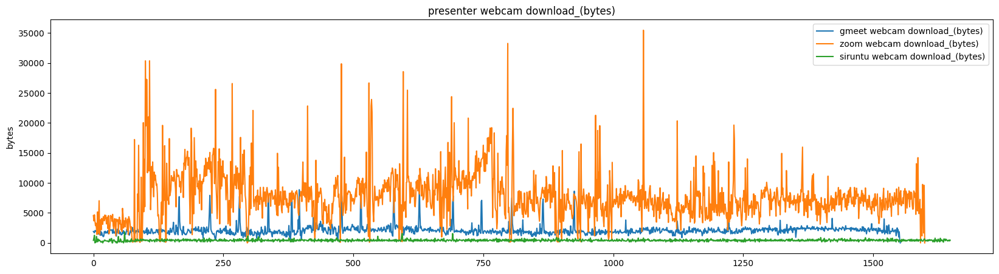

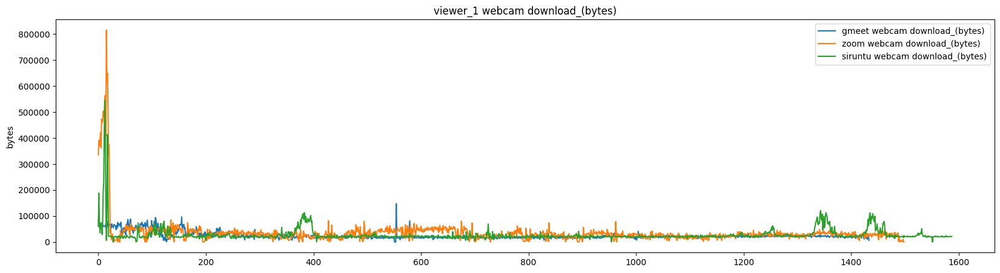

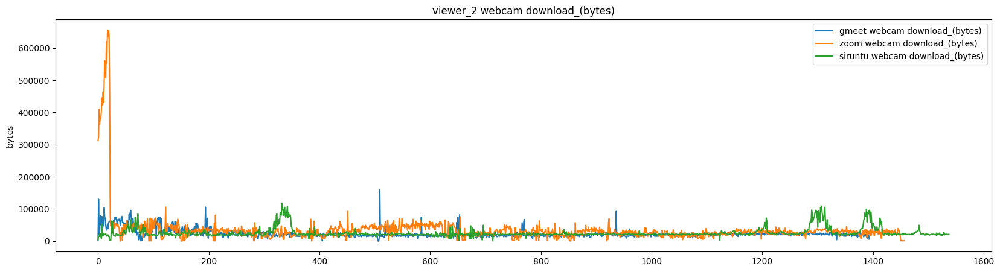

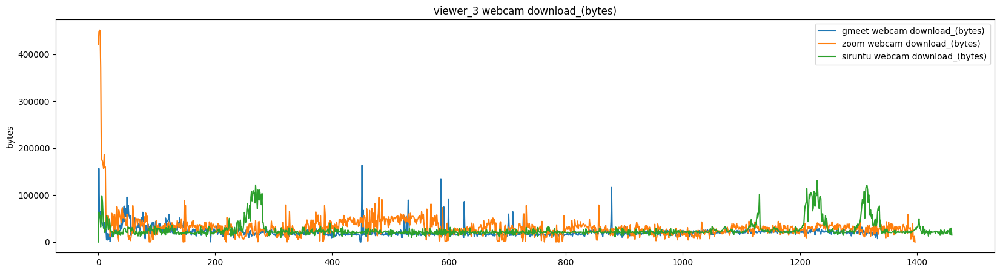

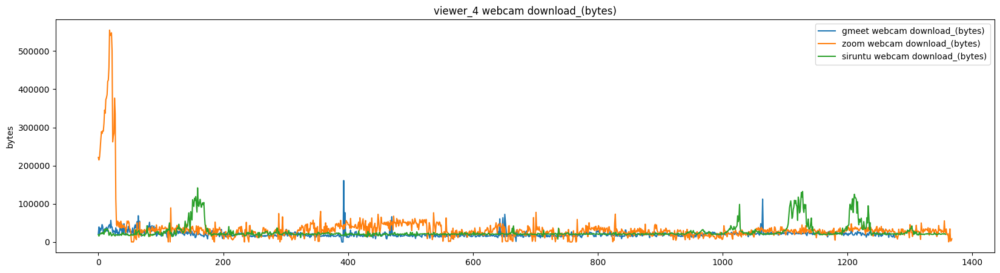

...

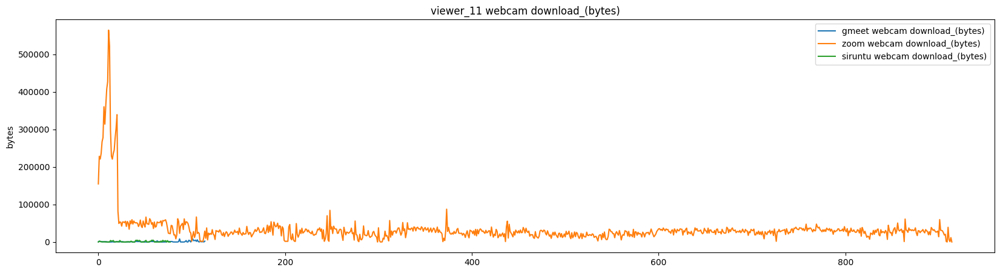

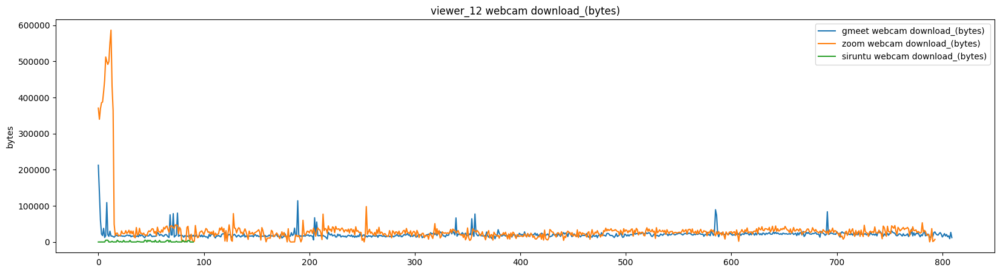

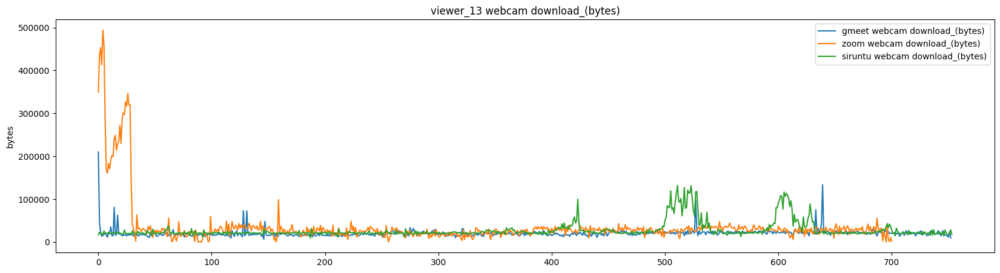

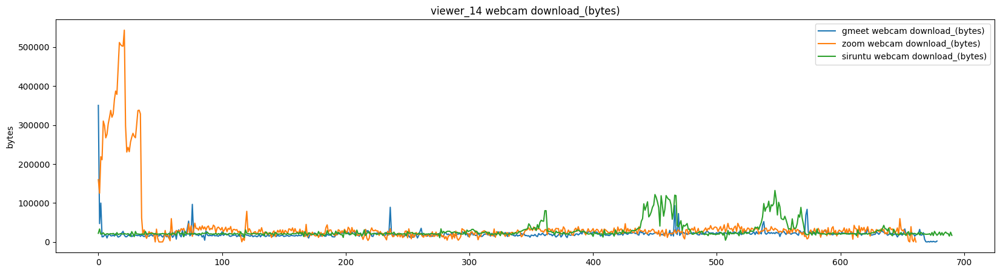

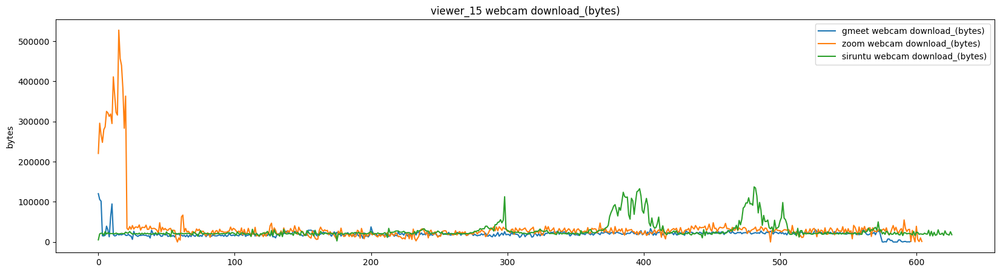

================== bandwidth_type: Download (bytes), media_stream: screen ==================


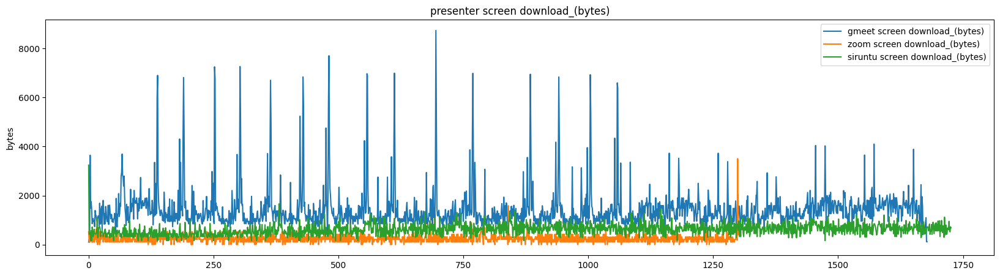

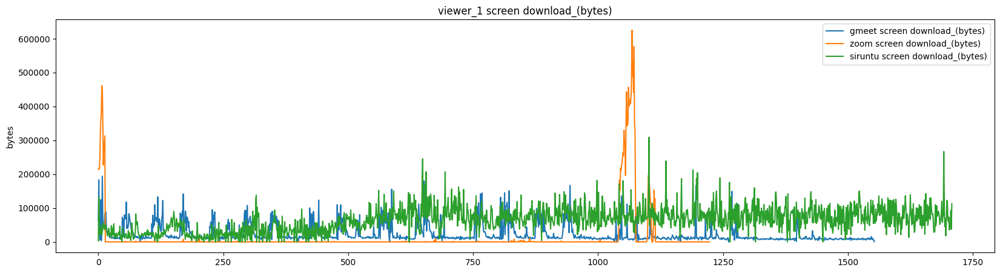

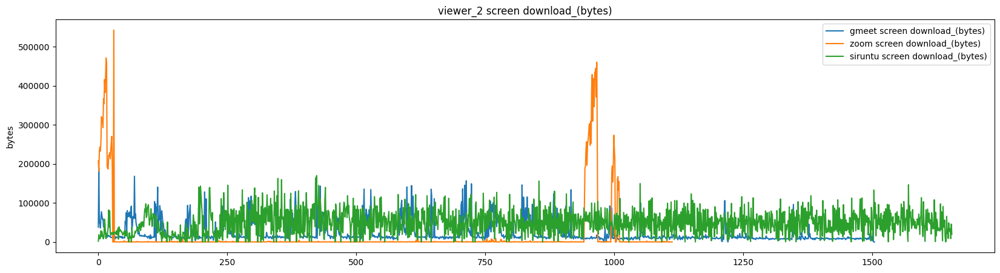

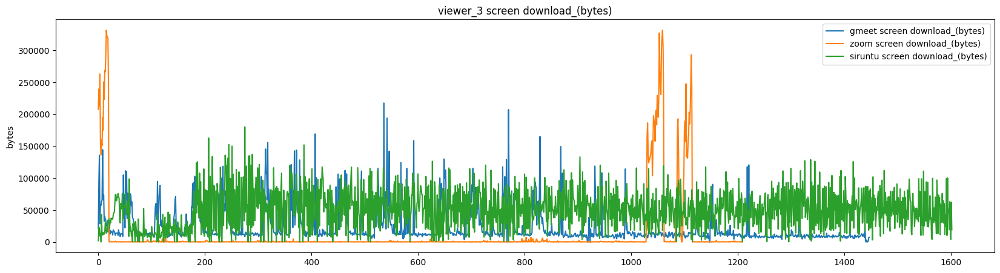

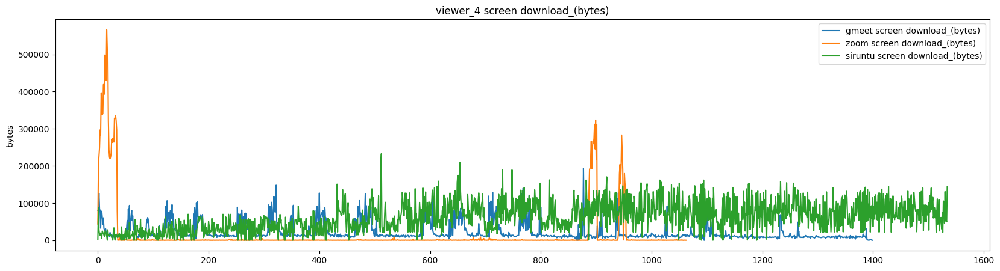

...

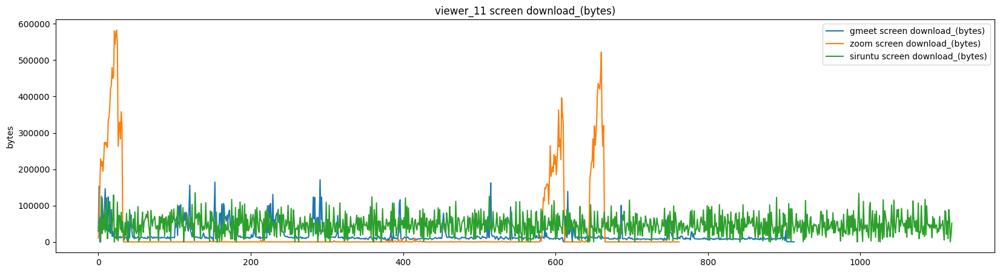

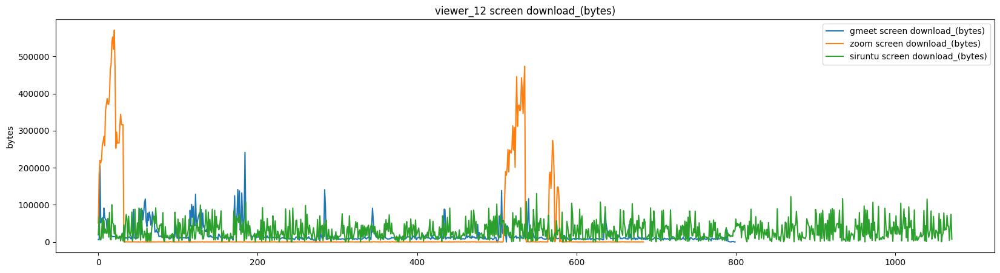

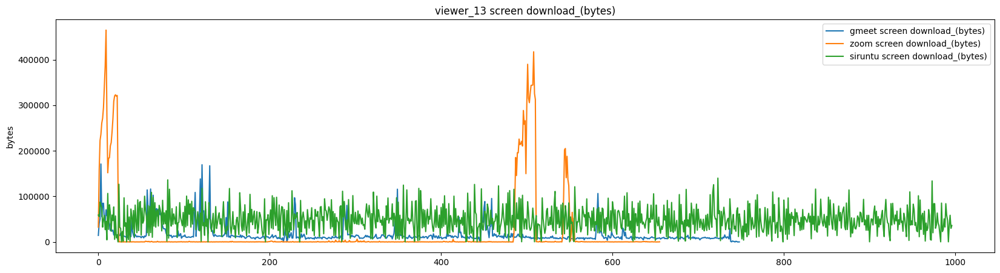

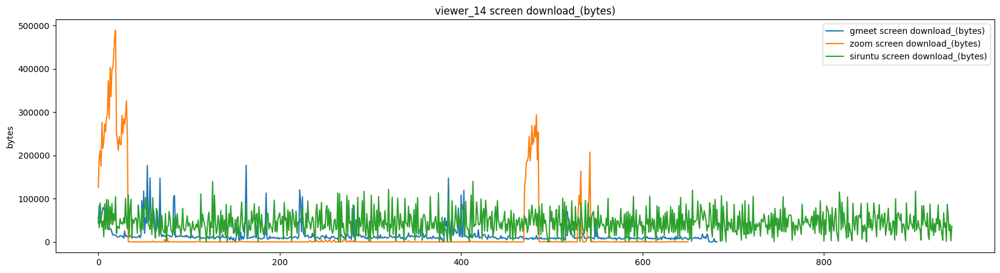

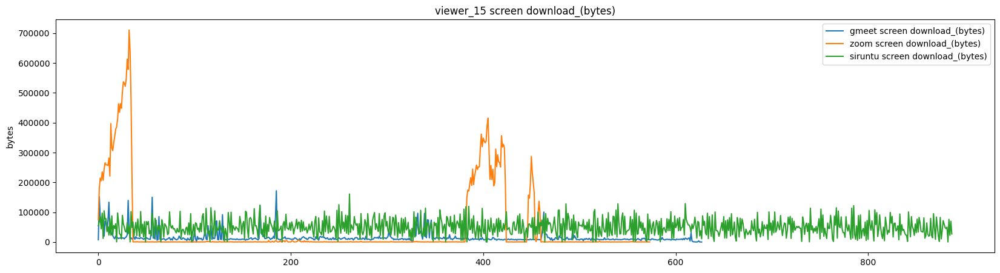

================== bandwidth_type: Upload (bytes), media_stream: webcam ==================


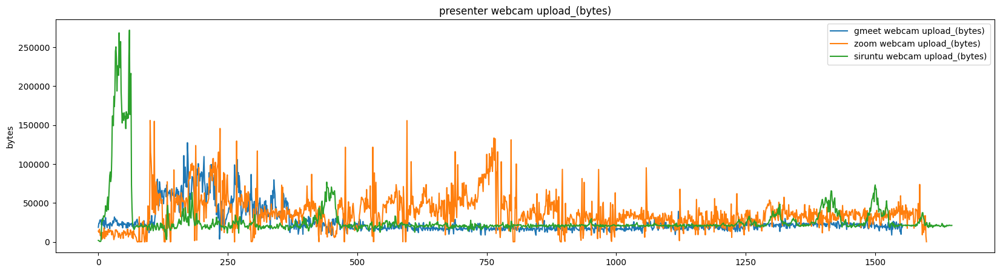

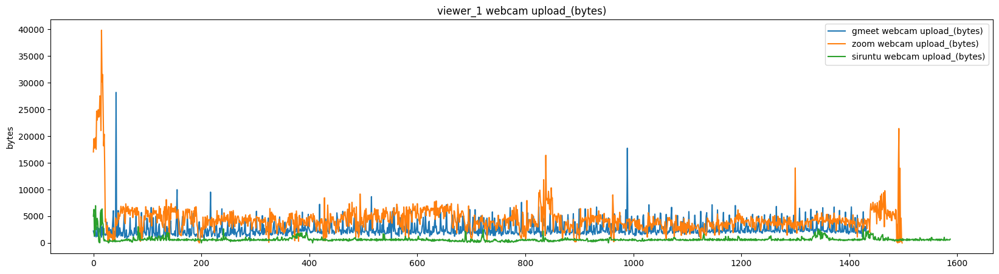

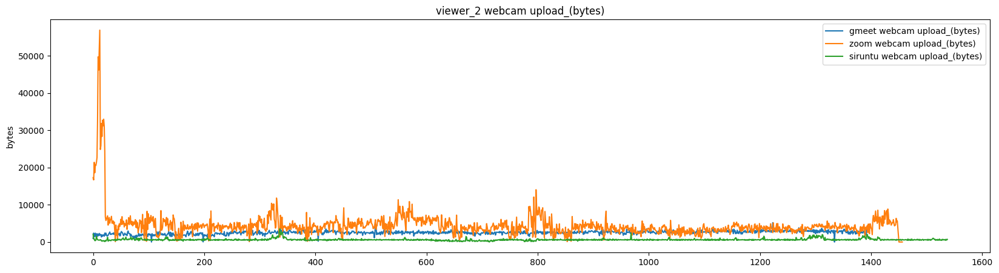

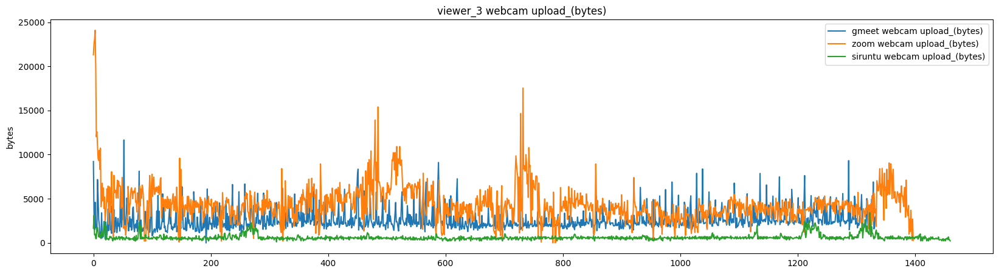

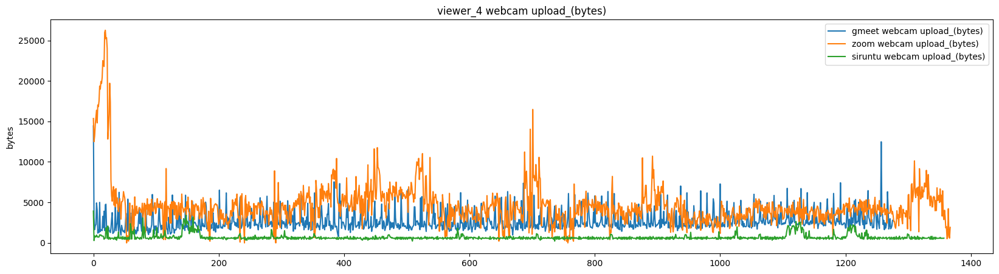

...

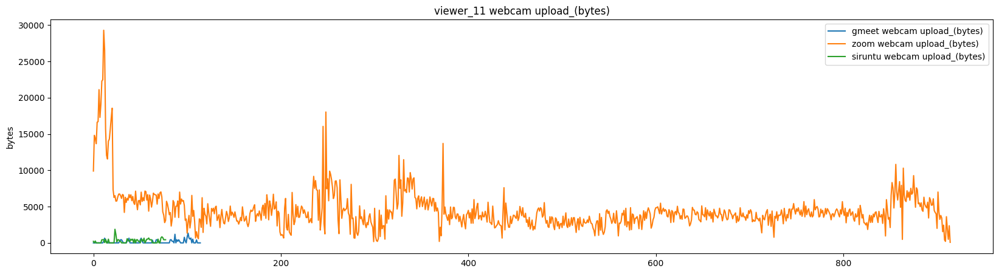

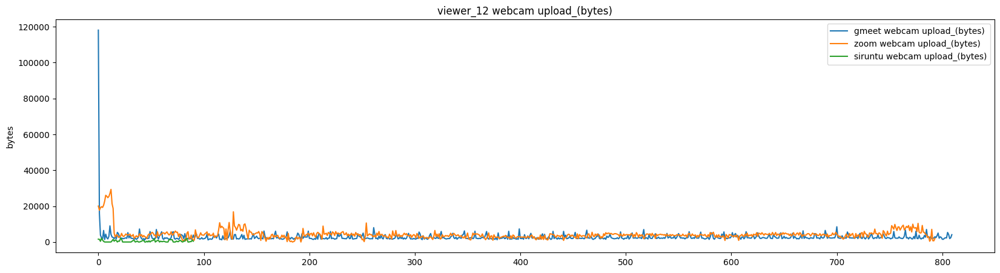

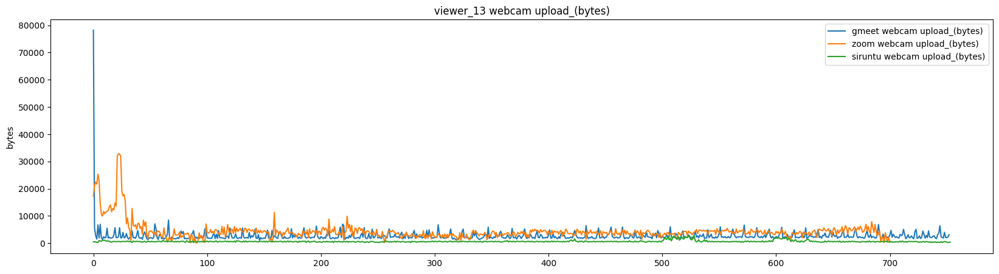

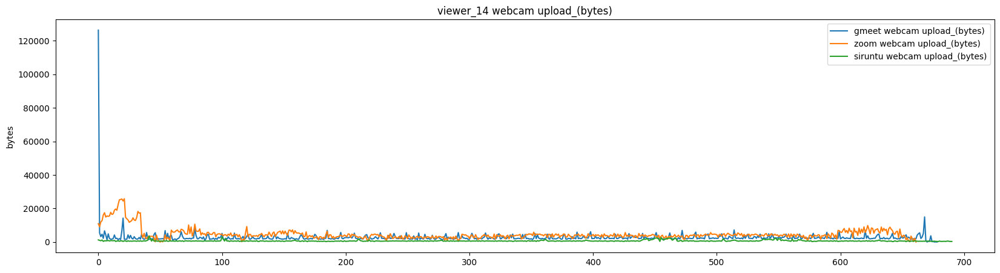

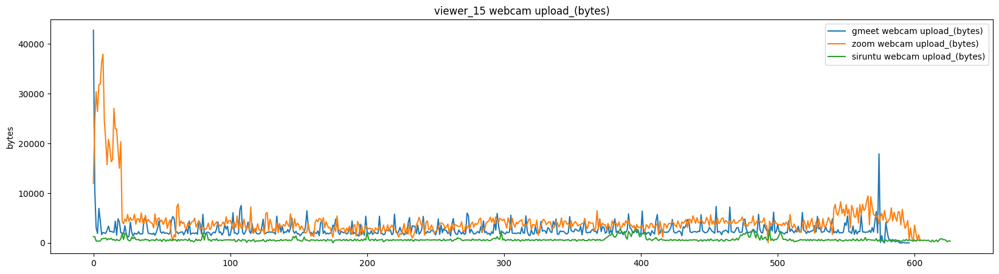

================== bandwidth_type: Upload (bytes), media_stream: screen ==================


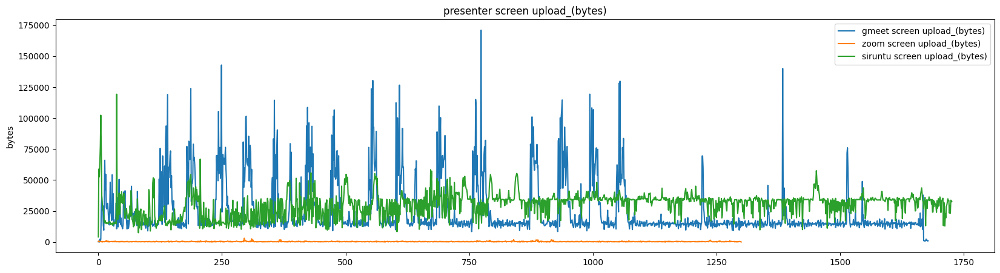

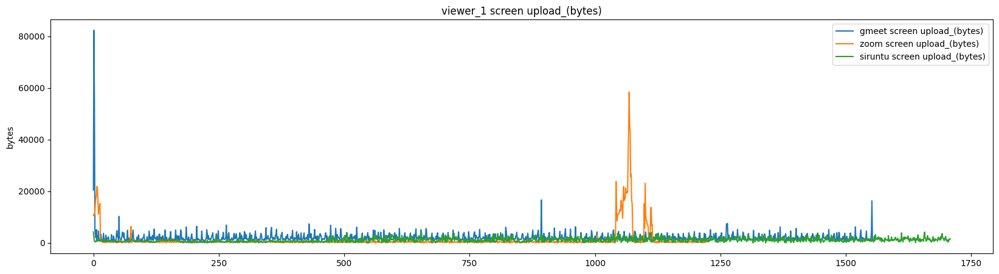

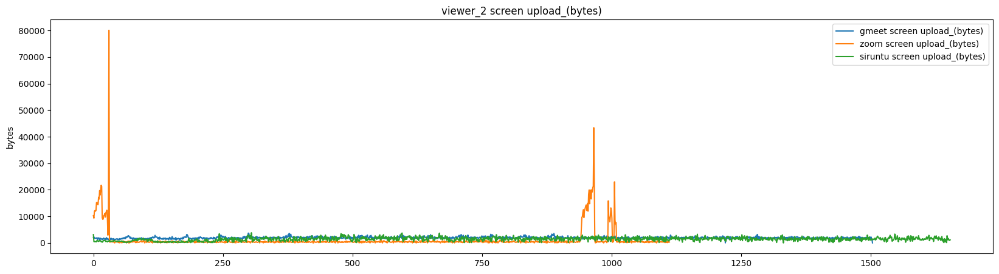

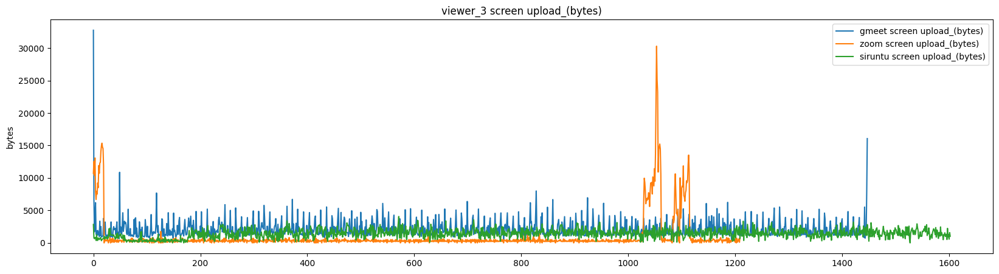

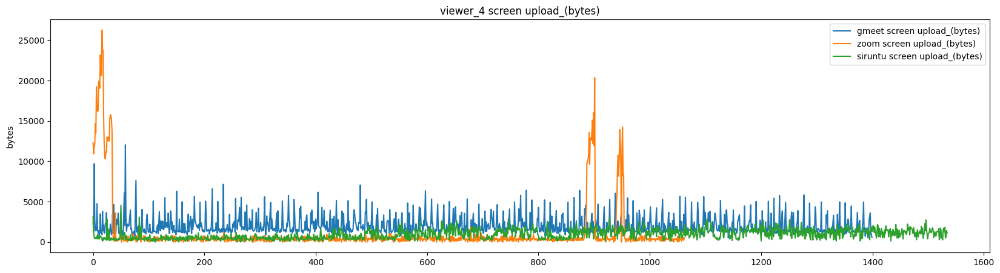

...

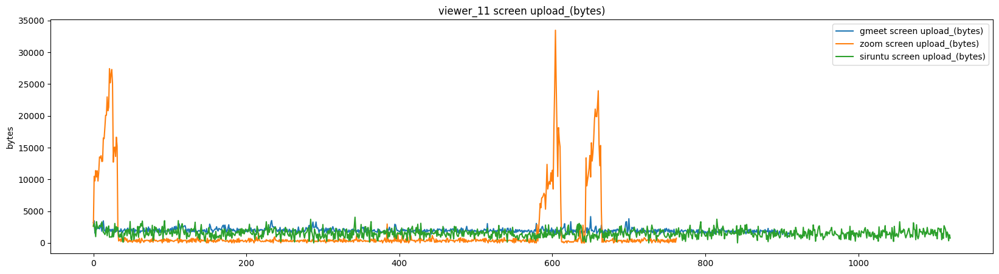

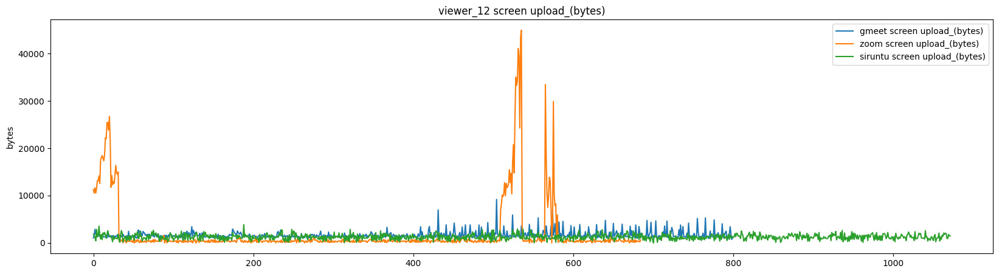

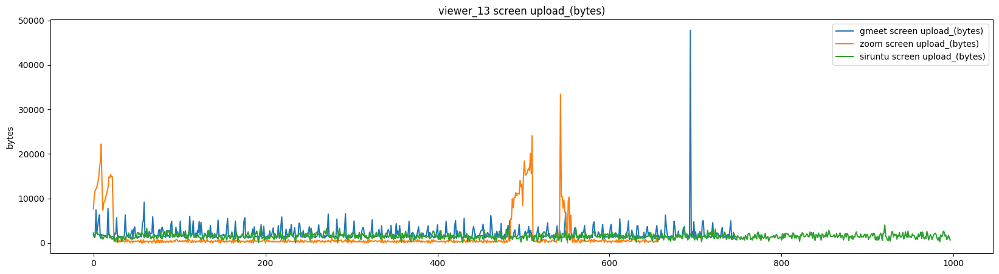

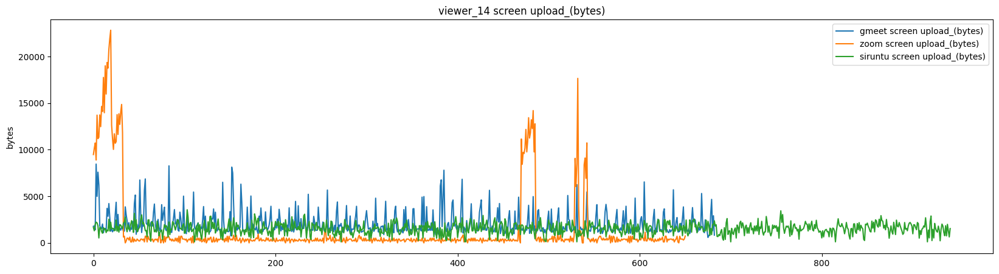

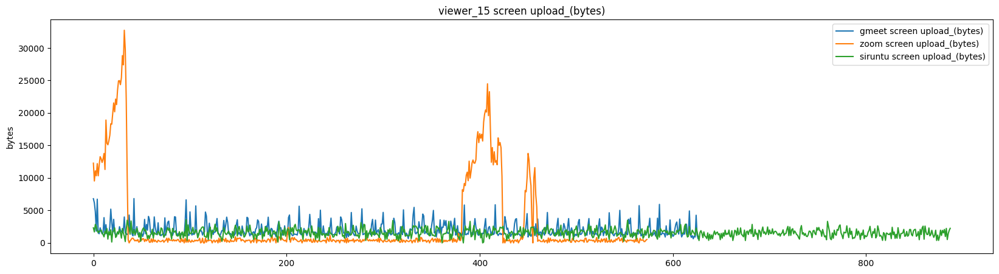

In [75]:

for bt in bandwidth_types:
    for ms in media_streams:
        print(f'================== bandwidth_type: {bt.replace("_", " ").capitalize()}, media_stream: {ms} ==================')
        for user in users:
            user_timestamps = bandwidth_timestamps[bandwidth_timestamps['name'] == user].iloc[0]
            gmeet_user = gmeet[gmeet['user'] == user]
            zoom_user = zoom[zoom['user'] == user]
            siruntu_user = siruntu[siruntu['user'] == user]

            ms_entered = f'{ms}_entered'
            ms_exited = f'{ms}_exited'

            gmeet_user = gmeet_user[(gmeet_user['time'] >= user_timestamps[f'gmeet_{ms_entered}']) & (gmeet_user['time'] <= user_timestamps[f'gmeet_{ms_exited}'])]
            zoom_user = zoom_user[(zoom_user['time'] >= user_timestamps[f'zoom_{ms_entered}']) & (zoom_user['time'] <= user_timestamps[f'zoom_{ms_exited}'])]
            siruntu_user = siruntu_user[(siruntu_user['time'] >= user_timestamps[f'siruntu_{ms_entered}']) & (siruntu_user['time'] <= user_timestamps[f'siruntu_{ms_exited}'])]

            gmeet_user = gmeet_user.reset_index(drop=True)
            zoom_user = zoom_user.reset_index(drop=True)
            siruntu_user = siruntu_user.reset_index(drop=True)

            gmeet_user['index'] = gmeet_user.index
            zoom_user['index'] = zoom_user.index
            siruntu_user['index'] = siruntu_user.index

            # gmeet_user.to_csv(f'csv/gmeet_{user}_{ms}_{bt}.csv')
            # zoom_user.to_csv(f'csv/zoom_{user}_{ms}_{bt}.csv')
            # siruntu_user.to_csv(f'csv/siruntu_{user}_{ms}_{bt}.csv')

            plt.title(f'{user} {ms} {bt}')
            plt.plot(gmeet_user['index'], gmeet_user[bt], label=f'gmeet {ms} {bt}')
            plt.plot(zoom_user['index'], zoom_user[bt], label=f'zoom {ms} {bt}')
            plt.plot(siruntu_user['index'], siruntu_user[bt], label=f'siruntu {ms} {bt}')
            plt.ylabel('bytes')
            plt.legend()
            plt.gcf().set_size_inches(20, 5)
            plt.show()

### RAM and CPU

In [76]:
import os

f = './csv/ram_cpu'
list_files = os.listdir(f)

# remove "CPU RAM - server_siruntu.csv" from list_folder
list_files.remove('CPU RAM - server_siruntu.csv')
# list_files

ram_cpu_df = pd.DataFrame()

for fil in list_files:
    df = pd.read_csv(f'{f}/{fil}')
    ram_cpu_df = pd.concat([ram_cpu_df, df])

ram_cpu_df = ram_cpu_df.drop(columns=['emial'])
ram_cpu_df['time'] = pd.to_datetime(ram_cpu_df['time'], format='%d/%m/%Y %H:%M:%S')
ram_cpu_df['memory'] = ram_cpu_df['memory'].astype(int)
ram_cpu_df['cpu'] = ram_cpu_df['cpu'].astype(float)

ram_cpu_df

,time,memory,cpu,app,media,user
0,2023-01-30 14:22:17,159488,68.8,gmeet,webcam,viewer_15
1,2023-01-30 14:23:00,153276,14.1,gmeet,webcam,viewer_15
2,2023-01-30 14:24:00,157996,12.5,gmeet,webcam,viewer_15
3,2023-01-30 14:25:00,156942,28.1,gmeet,webcam,viewer_15
4,2023-01-30 14:26:00,149800,12.5,gmeet,webcam,viewer_15
...,...,...,...,...,...,...
49,2023-02-15 15:16:00,68692,15.5,siruntu,screen,viewer_3
50,2023-02-15 15:17:00,68032,1.6,siruntu,screen,viewer_3
51,2023-02-15 15:18:00,68144,4.7,siruntu,screen,viewer_3
52,2023-02-15 15:19:00,67880,1.6,siruntu,screen,viewer_3


================== resource: memory, media_stream: webcam ==================


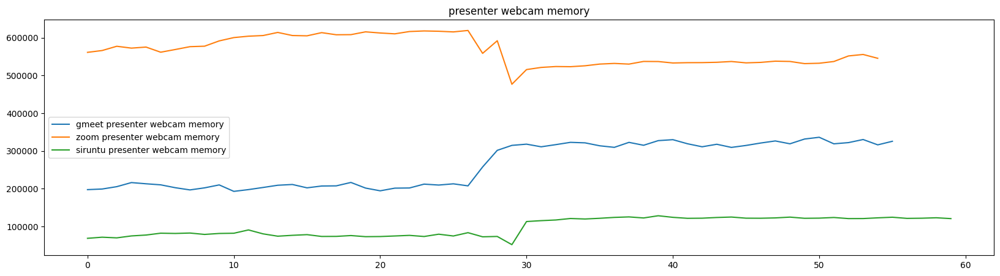

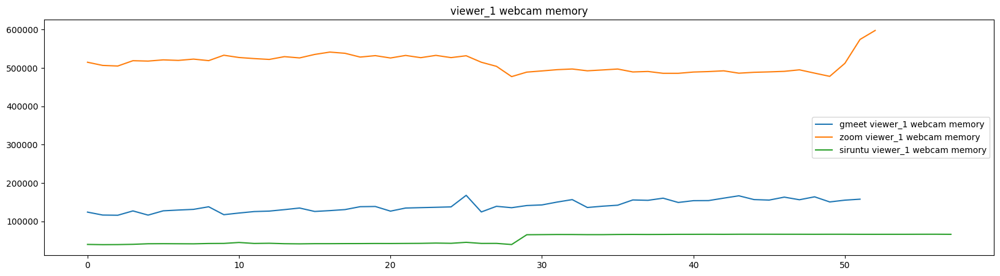

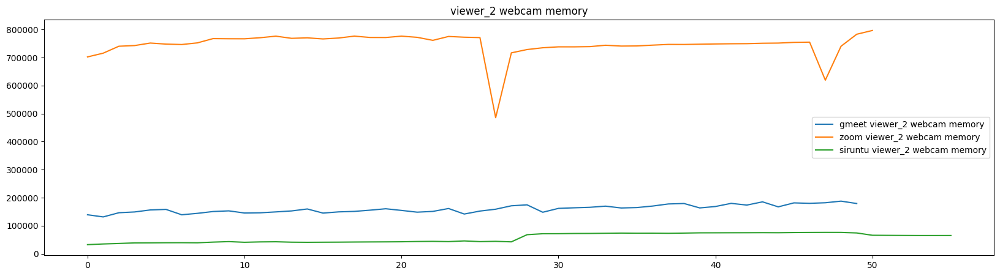

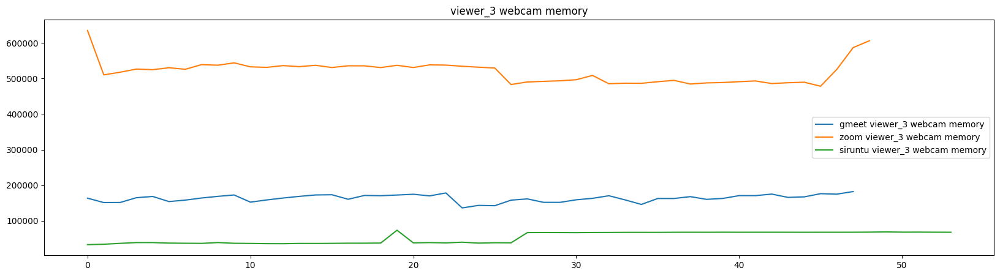

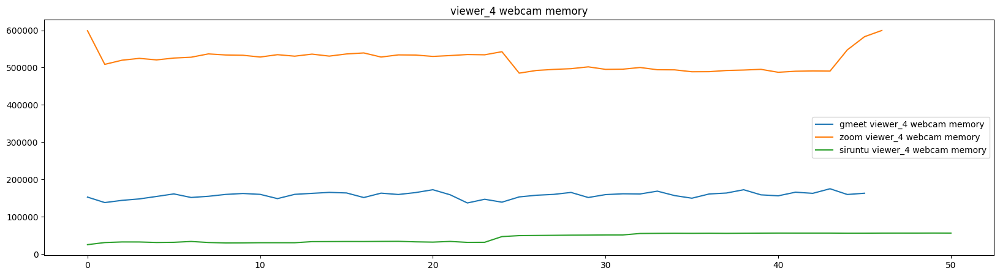

...

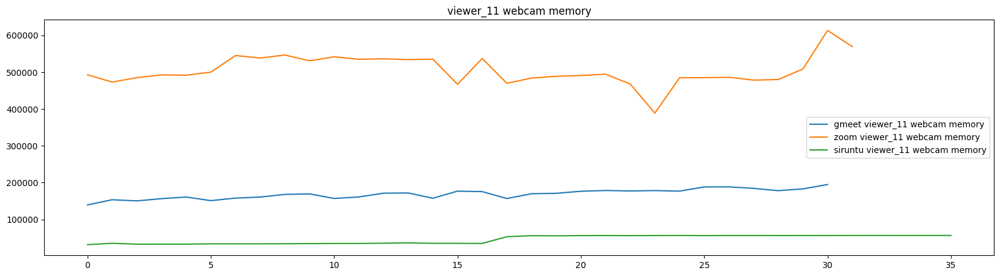

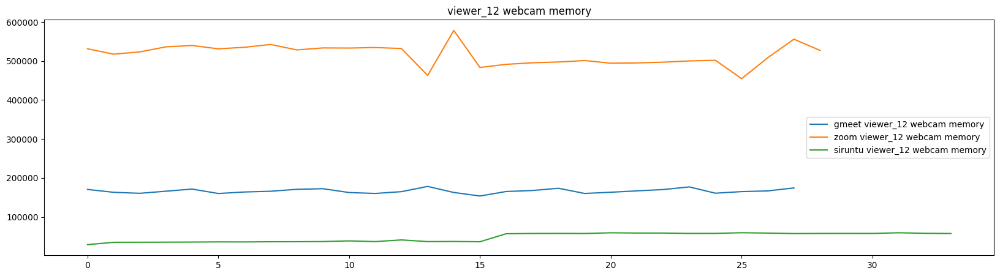

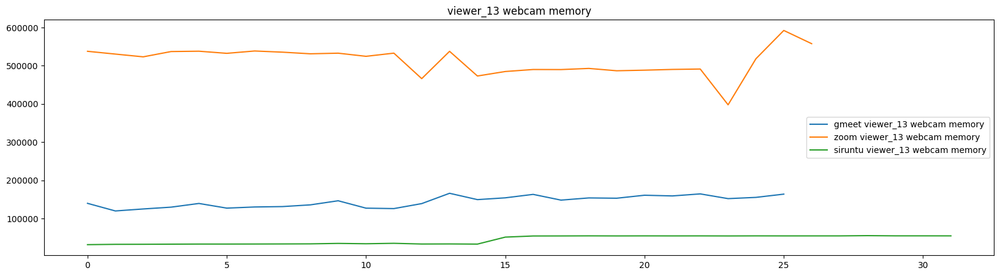

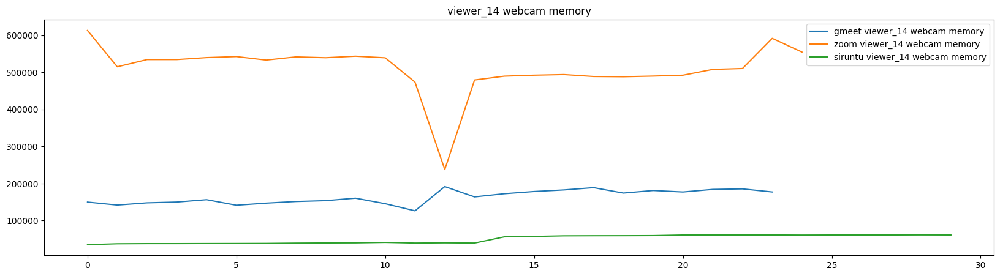

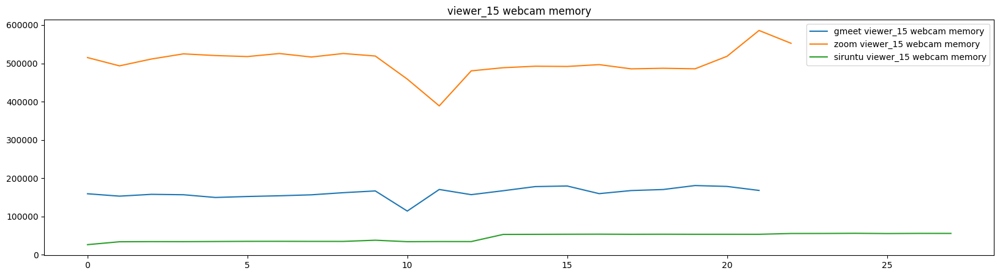

================== resource: memory, media_stream: screen ==================


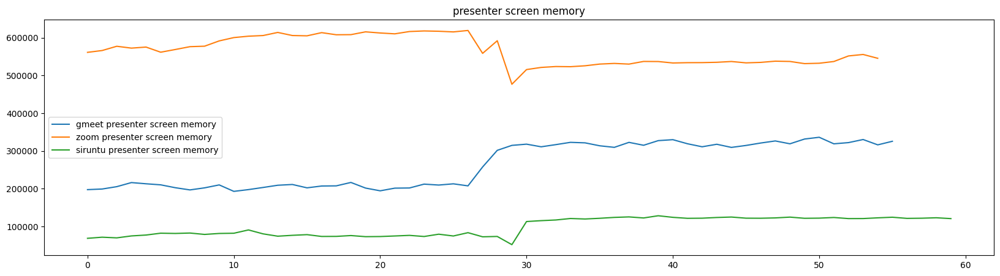

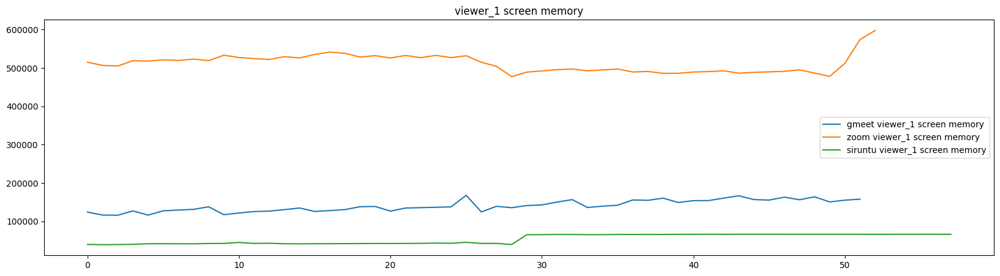

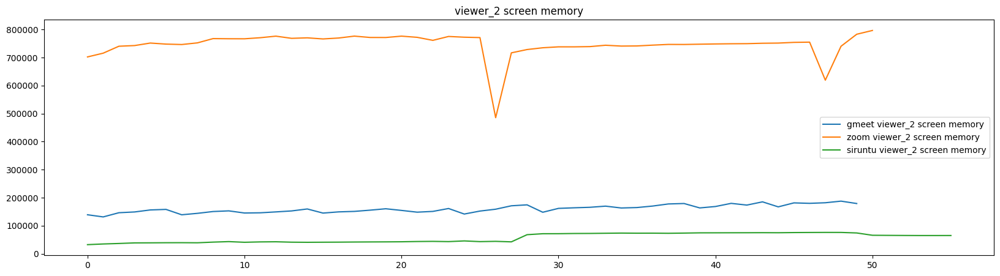

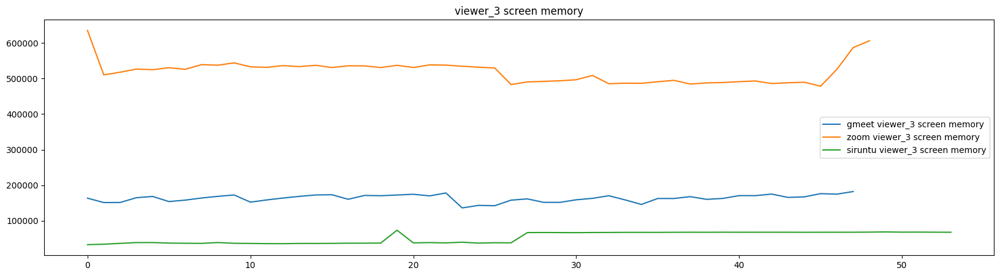

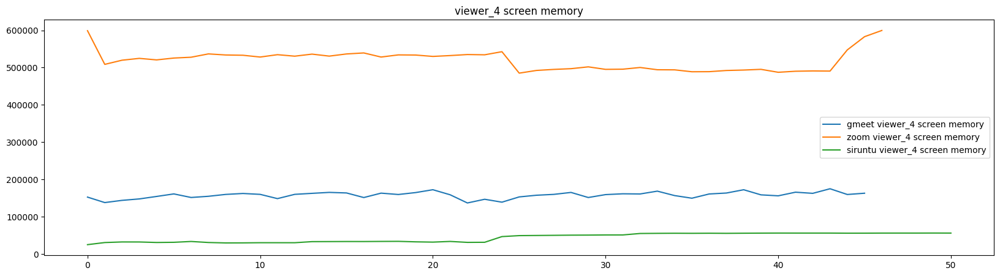

...

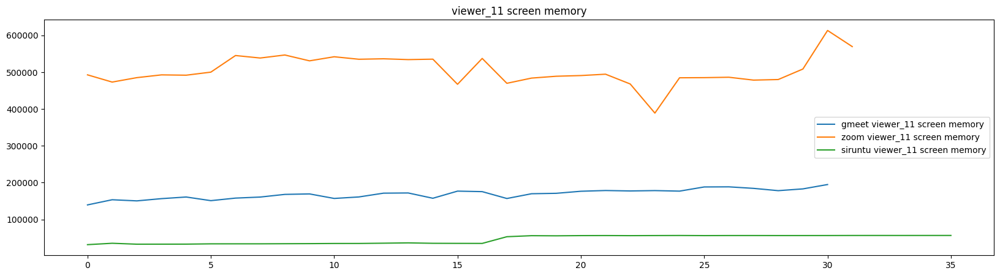

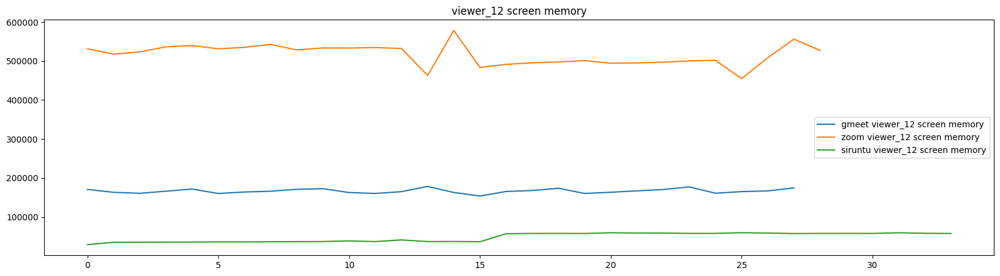

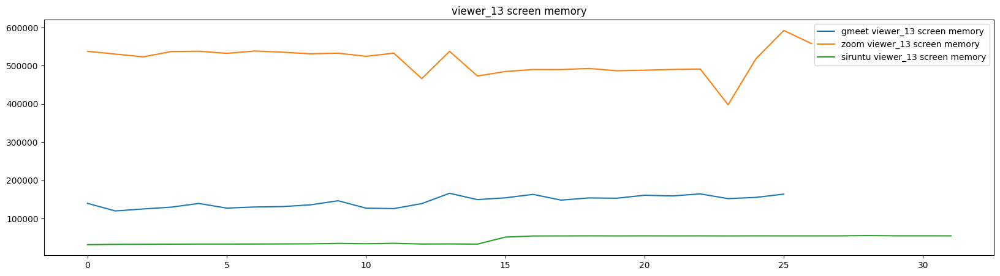

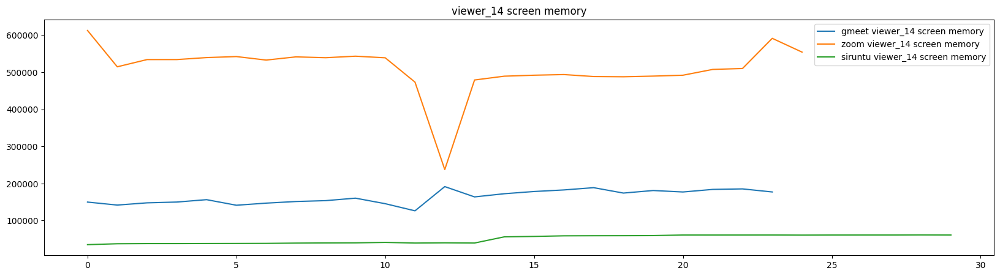

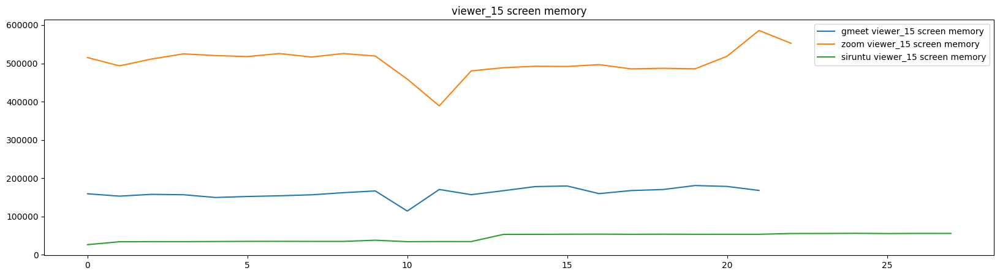

================== resource: cpu, media_stream: webcam ==================


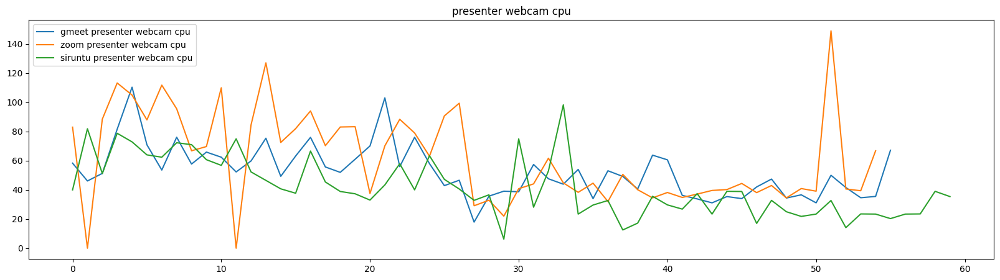

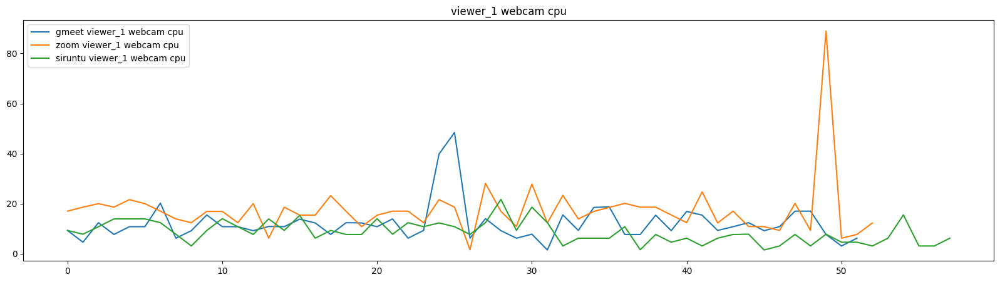

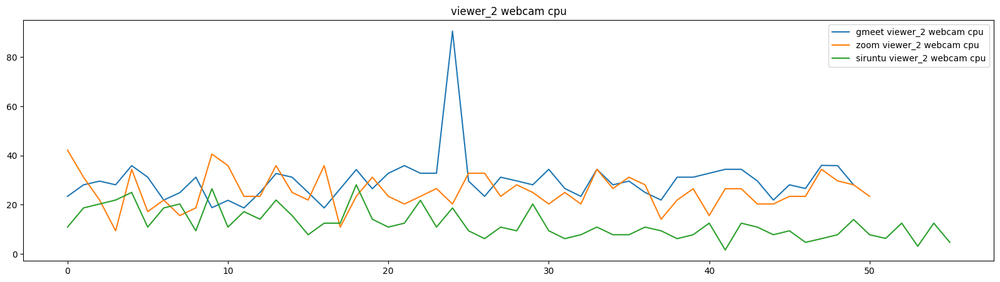

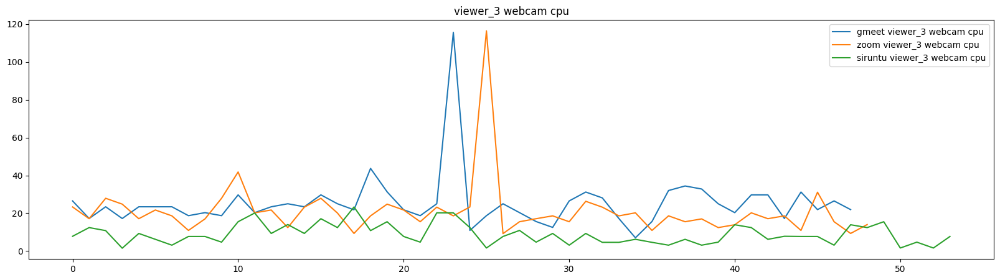

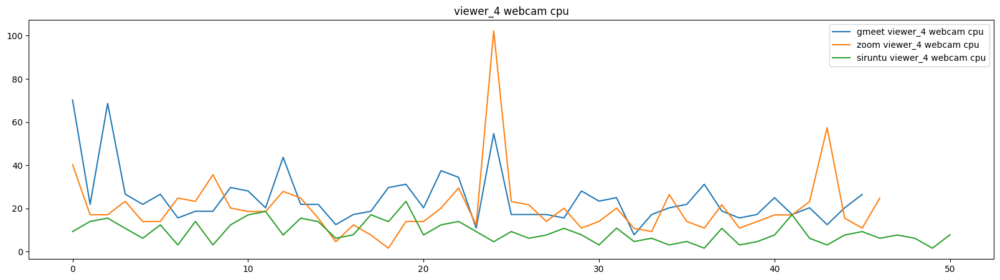

...

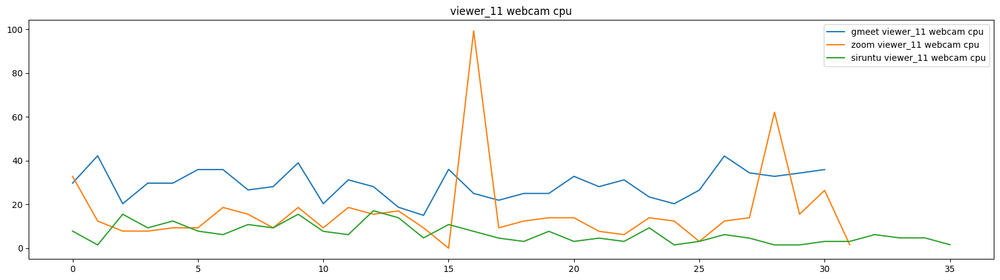

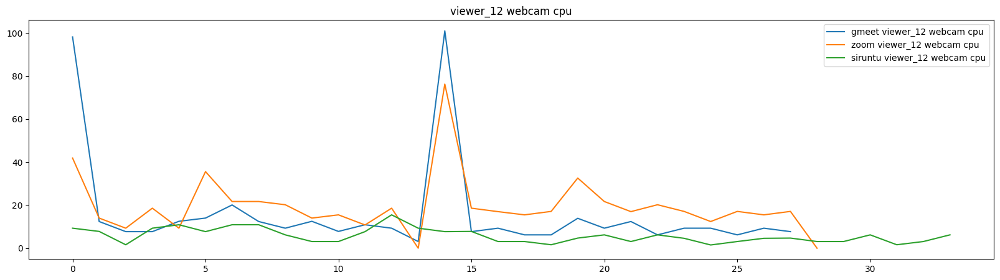

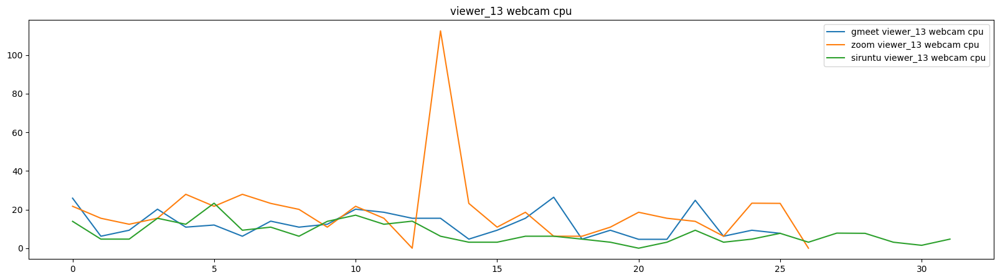

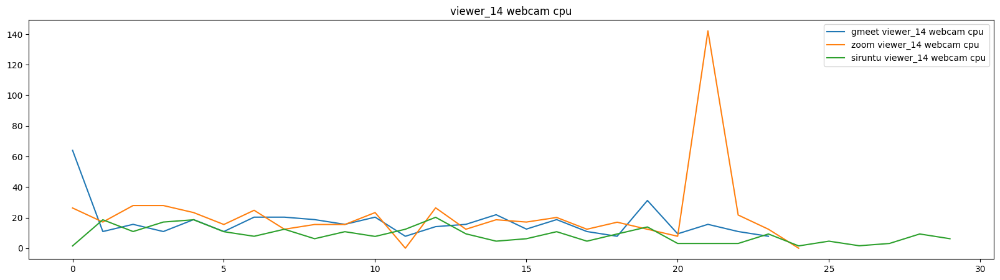

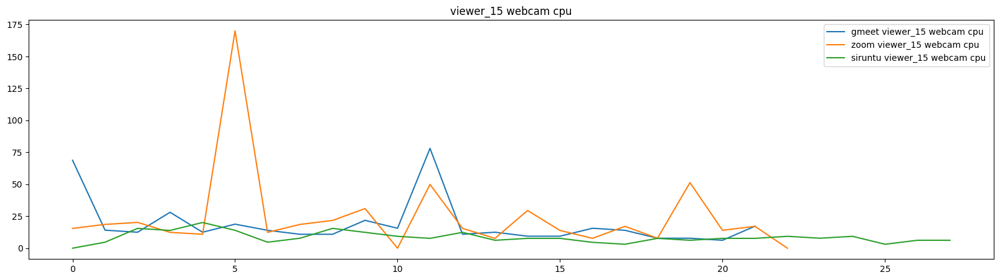

================== resource: cpu, media_stream: screen ==================


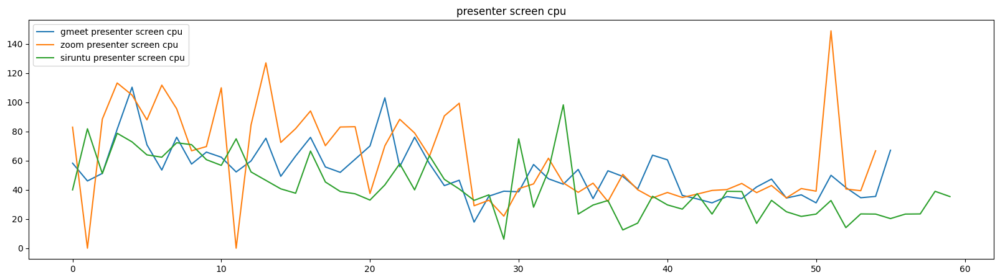

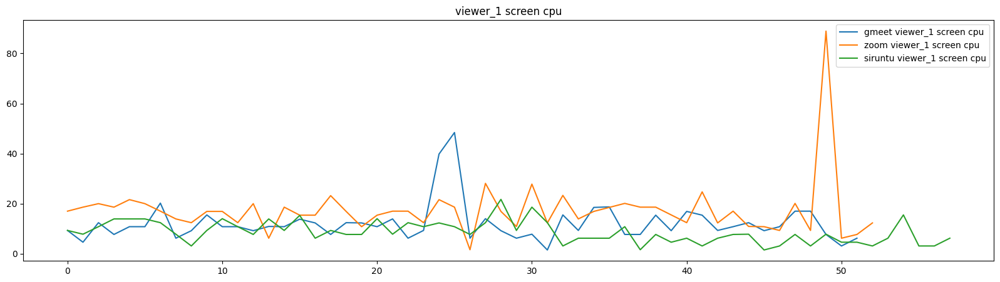

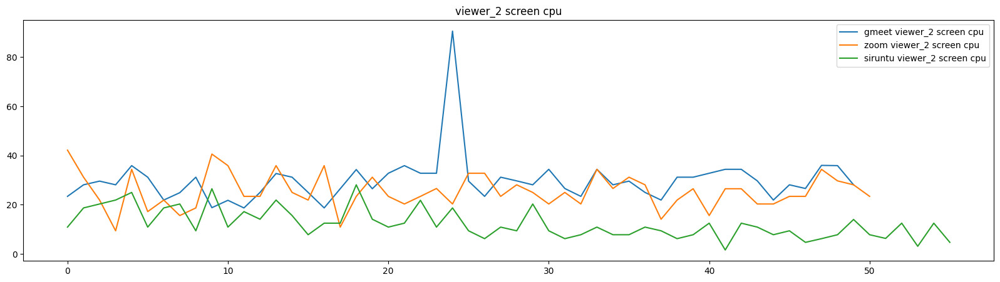

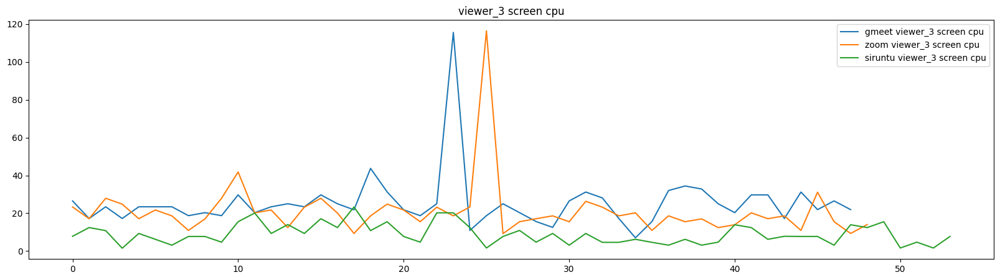

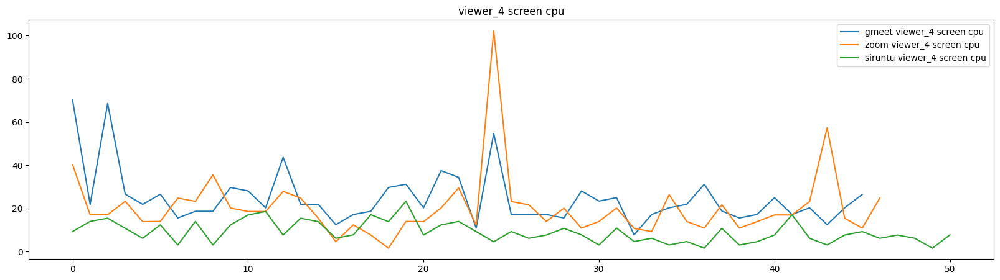

...

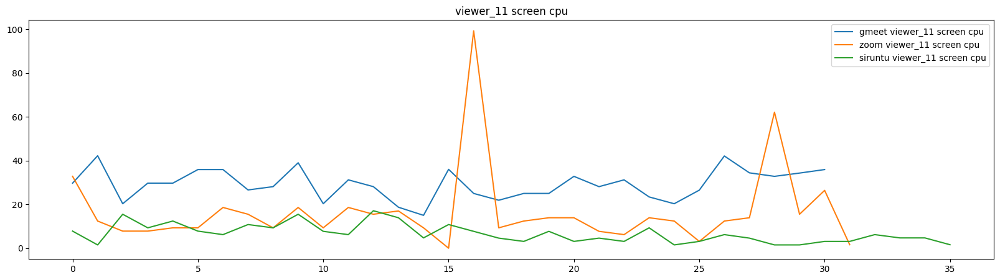

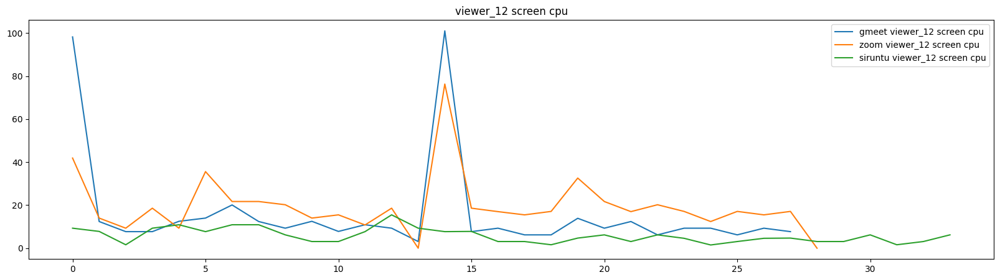

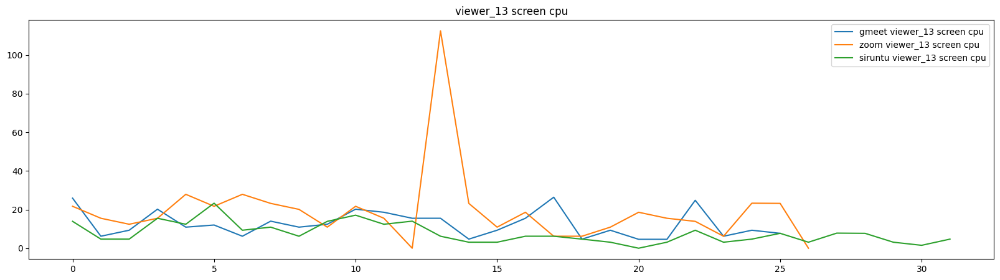

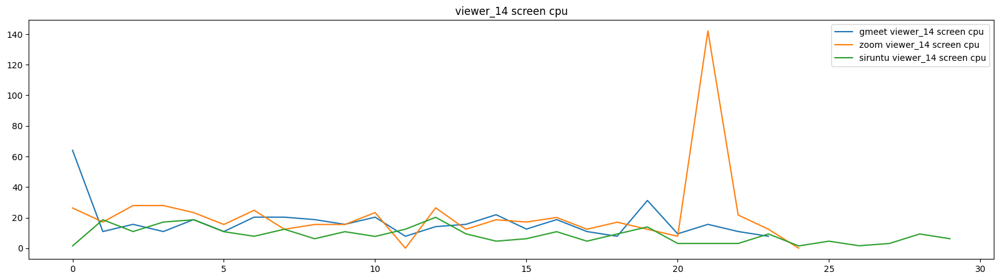

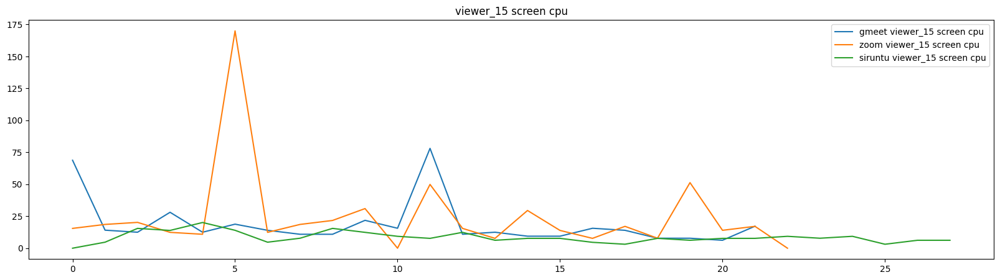

In [77]:
for rs in ['memory', 'cpu']:
    for ms in media_streams:
        print(f'================== resource: {rs}, media_stream: {ms} ==================')
        for user in users:
            ram_cpu_user = ram_cpu_df[ram_cpu_df['user'] == user]

            gmeet_resource = ram_cpu_user[ram_cpu_user['app'] == 'gmeet'].reset_index(drop=True)
            zoom_resource = ram_cpu_user[ram_cpu_user['app'] == 'zoom'].reset_index(drop=True)
            siruntu_resource = ram_cpu_user[ram_cpu_user['app'] == 'siruntu'].reset_index(drop=True)


            gmeet_resource['index'] = gmeet_resource.index
            zoom_resource['index'] = zoom_resource.index
            siruntu_resource['index'] = siruntu_resource.index

            plt.title(f'{user} {ms} {rs}')
            plt.plot(gmeet_resource['index'], gmeet_resource[rs], label=f'gmeet {user} {ms} {rs}')
            plt.plot(zoom_resource['index'], zoom_resource[rs], label=f'zoom {user} {ms} {rs}')
            plt.plot(siruntu_resource['index'], siruntu_resource[rs], label=f'siruntu {user} {ms} {rs}')

            plt.legend()
            plt.gcf().set_size_inches(20, 5)
            plt.show()

### Throughput (Download and Upload), CPU, and RAM in Server

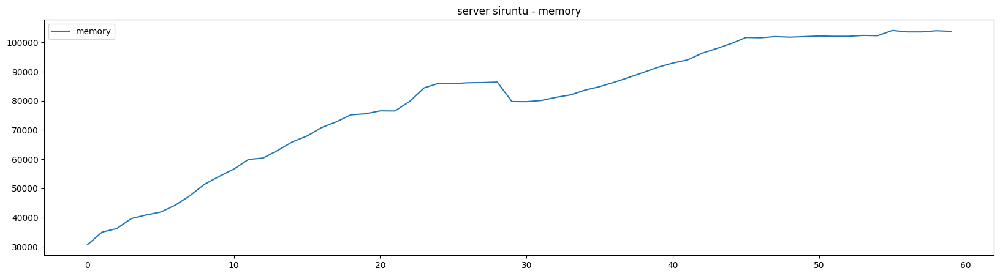

In [86]:
files = './csv/ram_cpu/CPU RAM - server_siruntu.csv'

df = pd.read_csv(files)
df['time'] = pd.to_datetime(df['time'], format='%d/%m/%Y %H:%M:%S')
df['memory'] = df['memory'].astype(int)
df['cpu'] = df['cpu'].astype(float)
# remove "," from donwload and upload columns dan replace with "."
df['download (bytes)'] = df['download (bytes)'].str.replace(',', '.').astype(float)
df['upload (bytes)'] = df['upload (bytes)'].str.replace(',', '.').astype(float)
# convert bytes to kbytes
df['download (bytes)'] = df['download (bytes)'] / 1024
df['upload (bytes)'] = df['upload (bytes)'] / 1024
# rename columns
df = df.rename(columns={'download (bytes)': 'download (kbytes)', 'upload (bytes)': 'upload (kbytes)'})
df['index'] = df.index

plt.title('server siruntu - memory')
plt.plot(df['index'], df['memory'], label='memory')
plt.legend()
plt.gcf().set_size_inches(20, 5)
plt.show()

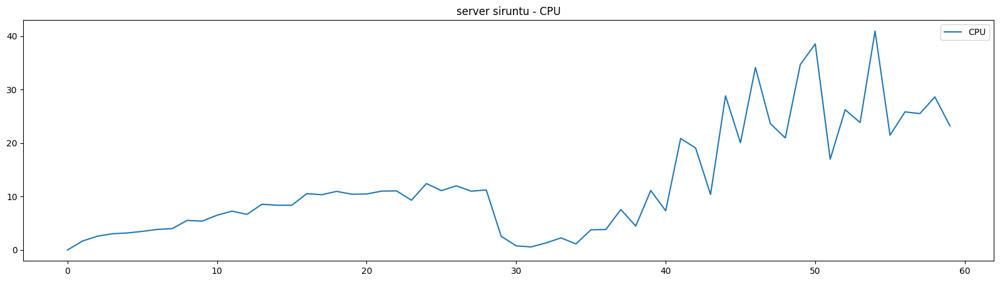

In [87]:
plt.title('server siruntu - CPU')
plt.plot(df['index'], df['cpu'], label='CPU')
plt.legend()
plt.gcf().set_size_inches(20, 5)
plt.show()

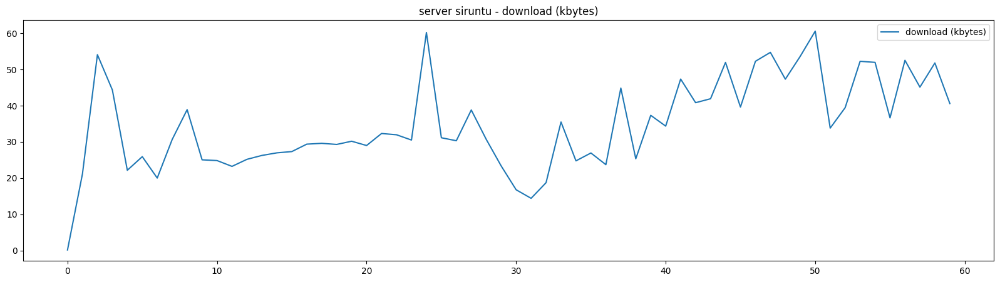

In [94]:
plt.title('server siruntu - download (kbytes)')
plt.plot(df['index'], df['download (kbytes)'], label='download (kbytes)')
plt.legend()
plt.gcf().set_size_inches(20, 5)
plt.show()

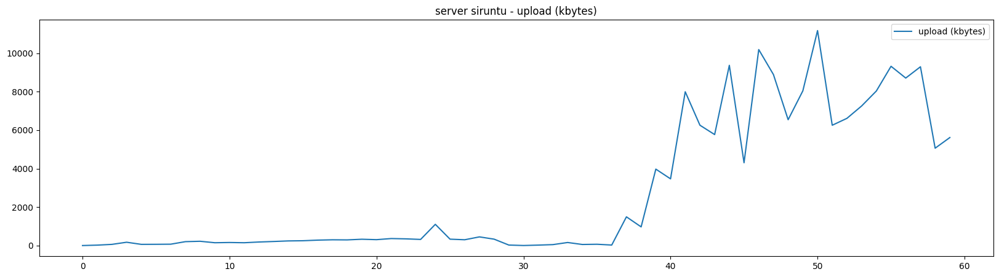

In [93]:


plt.title('server siruntu - upload (kbytes)')
plt.plot(df['index'], df['upload (kbytes)'], label='upload (kbytes)')
plt.legend()
plt.gcf().set_size_inches(20, 5)
plt.show()